# 0. Configuração de Ambiente **padrão**

In [1]:
%%bash
# Instalar miniconda e mamba (padrão já visto em aula)
wget --quiet https://github.com/conda-forge/miniforge/releases/latest/download/Miniforge3-Linux-x86_64.sh
bash Miniforge3-Linux-x86_64.sh -b -p /usr/local -u
mamba init
mamba config set auto_activate_base true
mamba shell init --shell bash --root-prefix=~/.local/share/mamba
rm Miniforge3-Linux-x86_64.sh

PREFIX=/usr/local
Unpacking bootstrapper...
Unpacking payload...
Extracting _libgcc_mutex-0.1-conda_forge.tar.bz2
Extracting ca-certificates-2025.10.5-hbd8a1cb_0.conda
Extracting libgomp-15.2.0-h767d61c_7.conda
Extracting nlohmann_json-abi-3.12.0-h0f90c79_1.conda
Extracting pybind11-abi-4-hd8ed1ab_3.tar.bz2
Extracting python_abi-3.12-8_cp312.conda
Extracting tzdata-2025b-h78e105d_0.conda
Extracting _openmp_mutex-4.5-2_gnu.tar.bz2
Extracting libgcc-15.2.0-h767d61c_7.conda
Extracting bzip2-1.0.8-hda65f42_8.conda
Extracting c-ares-1.34.5-hb9d3cd8_0.conda
Extracting keyutils-1.6.3-hb9d3cd8_0.conda
Extracting libexpat-2.7.1-hecca717_0.conda
Extracting libffi-3.5.2-h9ec8514_0.conda
Extracting libgcc-ng-15.2.0-h69a702a_7.conda
Extracting libiconv-1.18-h3b78370_2.conda
Extracting liblzma-5.8.1-hb9d3cd8_2.conda
Extracting libnsl-2.0.1-hb9d3cd8_1.conda
Extracting libstdcxx-15.2.0-h8f9b012_7.conda
Extracting libuuid-2.41.2-he9a06e4_0.conda
Extracting libzlib-1.3.1-hb9d3cd8_2.conda
Extracting lzo-

warning  libmamba [python-3.12.12-hd63d673_1_cpython] The following files were already present in the environment:
    - bin/python
warning  libmamba [charset-normalizer-3.4.4-pyhd8ed1ab_0] The following files were already present in the environment:
    - bin/normalizer
warning  libmamba [distro-1.9.0-pyhd8ed1ab_1] The following files were already present in the environment:
    - bin/distro
warning  libmamba [jsonpointer-3.0.0-py312h7900ff3_2] The following files were already present in the environment:
    - bin/jsonpointer
warning  libmamba [wheel-0.45.1-pyhd8ed1ab_1] The following files were already present in the environment:
    - bin/wheel
warning  libmamba [jsonpatch-1.33-pyhd8ed1ab_1] The following files were already present in the environment:
    - bin/jsondiff
    - bin/jsonpatch
warning  libmamba [pip-25.2-pyh8b19718_0] The following files were already present in the environment:
    - bin/pip
    - bin/pip3
warning  libmamba [tqdm-4.67.1-pyhd8ed1ab_1] The following files

In [2]:
%%bash
# Instalar os software que vamos usar nesta prática
mamba install -c bioconda -c conda-forge fastqc bwa cutadapt samtools kraken2 krona blast seqtk spades -y


Pinned packages:

  - python=3.12


Transaction

  Prefix: /usr/local

  Updating specs:

   - fastqc
   - bwa
   - cutadapt
   - samtools
   - kraken2
   - krona
   - blast
   - seqtk
   - spades


  Package                       Version  Build             Channel          Size
──────────────────────────────────────────────────────────────────────────────────
  Install:
──────────────────────────────────────────────────────────────────────────────────

  + blast                        2.17.0  h66d330f_0        bioconda         85MB
  + bwa                          0.7.19  h577a1d6_1        bioconda        654kB
  + curl                         8.16.0  h4e3cde8_0        conda-forge     183kB
  + cutadapt                        5.2  py312h0fa9677_0   bioconda        318kB
  + dnaio                         1.2.2  py312hf67a6ed_0   bioconda        153kB
  + entrez-direct                  24.0  he881be0_0        bioconda         17MB
  + fastqc                       0.12.1  hdfd78af_0    

warning  libmamba [freetype-2.14.1-ha770c72_0] The following files were already present in the environment:
    - lib/libfreetype.so


In [3]:
%%bash
# Testa se um deles foi instalado corretamente (deve printar o manual de uso do programa)
kraken2 --help

Usage: kraken2 [options] <filename(s)>

Options:
  --db NAME               Name for Kraken 2 DB
                          (default: none)
  --threads NUM           Number of threads (default: 1)
  --quick                 Quick operation (use first hit or hits)
  --unclassified-out FILENAME
                          Print unclassified sequences to filename
  --classified-out FILENAME
                          Print classified sequences to filename
  --output FILENAME       Print output to filename (default: stdout); "-" will
                          suppress normal output
  --confidence FLOAT      Confidence score threshold (default: 0.0); must be
                          in [0, 1].
  --minimum-base-quality NUM
                          Minimum base quality used in classification (def: 0,
                          only effective with FASTQ input).
  --report FILENAME       Print a report with aggregrate counts/clade to file
  --use-mpa-style         With --report, format report output

In [4]:
%%bash
# Criar as pastas para organizar os arquivos que serão gerados
mkdir raw fastqc cutadapt bwa krakenDB kraken2 krona blast spades

In [5]:
%%bash
# Mover arquivos para as suas respectivas pastas
mv *.fastq.gz raw/
gunzip -c Chr15-reference.fasta.gz | tee bwa/Chr15-reference.fasta > blast/Chr15-reference.fasta

**Checkpoint 1:**  
Antes de seguir, verifique se as pastas foram criadas. Os arquivos fastqs do pacientes deve estar dentro da pasta raw/ (2 arquivos), o arquivo fasta da referência deve estar dentro da pasta bwa/ e o arquivo fasta do banco dentro de blast/.

# 1. Controle de Qualidade

A partir de agora, serão realizados todos os comandos para o ```patient1```.


In [6]:
%%bash
# Gerar o relatório da qualidade dos reads de sequenciamento
fastqc -o fastqc/ raw/caso1-sindrome-respiratoriav2_R1.fastq.gz raw/caso1-sindrome-respiratoriav2_R2.fastq.gz

application/gzip
application/gzip
Analysis complete for caso1-sindrome-respiratoriav2_R1.fastq.gz
Analysis complete for caso1-sindrome-respiratoriav2_R2.fastq.gz


Started analysis of caso1-sindrome-respiratoriav2_R1.fastq.gz
Approx 5% complete for caso1-sindrome-respiratoriav2_R1.fastq.gz
Approx 10% complete for caso1-sindrome-respiratoriav2_R1.fastq.gz
Approx 15% complete for caso1-sindrome-respiratoriav2_R1.fastq.gz
Approx 20% complete for caso1-sindrome-respiratoriav2_R1.fastq.gz
Approx 25% complete for caso1-sindrome-respiratoriav2_R1.fastq.gz
Approx 30% complete for caso1-sindrome-respiratoriav2_R1.fastq.gz
Approx 35% complete for caso1-sindrome-respiratoriav2_R1.fastq.gz
Approx 40% complete for caso1-sindrome-respiratoriav2_R1.fastq.gz
Approx 45% complete for caso1-sindrome-respiratoriav2_R1.fastq.gz
Approx 50% complete for caso1-sindrome-respiratoriav2_R1.fastq.gz
Approx 55% complete for caso1-sindrome-respiratoriav2_R1.fastq.gz
Approx 60% complete for caso1-sindrome-respiratoriav2_R1.fastq.gz
Approx 65% complete for caso1-sindrome-respiratoriav2_R1.fastq.gz
Approx 70% complete for caso1-sindrome-respiratoriav2_R1.fastq.gz
Approx 75% comp

In [7]:
%%bash
cutadapt \
  -u 5 -U 5 \
  -u -5 -U -5 \
  -m 90 \
  -o cutadapt/caso1-sindrome-respiratoriav2-trimmed_R1.fastq.gz \
  -p cutadapt/caso1-sindrome-respiratoriav2-trimmed_R2.fastq.gz \
  raw/caso1-sindrome-respiratoriav2_R1.fastq.gz \
  raw/caso1-sindrome-respiratoriav2_R2.fastq.gz

This is cutadapt 5.2 with Python 3.12.12
Command line parameters: -u 5 -U 5 -u -5 -U -5 -m 90 -o cutadapt/caso1-sindrome-respiratoriav2-trimmed_R1.fastq.gz -p cutadapt/caso1-sindrome-respiratoriav2-trimmed_R2.fastq.gz raw/caso1-sindrome-respiratoriav2_R1.fastq.gz raw/caso1-sindrome-respiratoriav2_R2.fastq.gz
Processing paired-end reads on 1 core ...

=== Summary ===

Total read pairs processed:          6,000,000

== Read fate breakdown ==
Pairs that were too short:                   7 (0.0%)
Pairs written (passing filters):     5,999,993 (100.0%)

Total basepairs processed: 1,799,985,476 bp
  Read 1:   899,986,928 bp
  Read 2:   899,998,548 bp
Total written (filtered):  1,679,983,911 bp (93.3%)
  Read 1:   839,986,072 bp
  Read 2:   839,997,839 bp


# 2. Preparar o banco de dados para busca de patógenos

Para este tipo de pipeline de bioinformática, o princípio é realizar buscas dos reads de sequênciamento contra um banco de sequências conhecidas, e assim fazer a classificação do que é desconhecido (com alguns passos adicionais como mostra a figura abaixo).  
O banco de dados de sequências conhecidas que vamos usar é muito importante, pois se ele não tiver o organismos que queremos identificar, ele não fará a classificação adequada.  

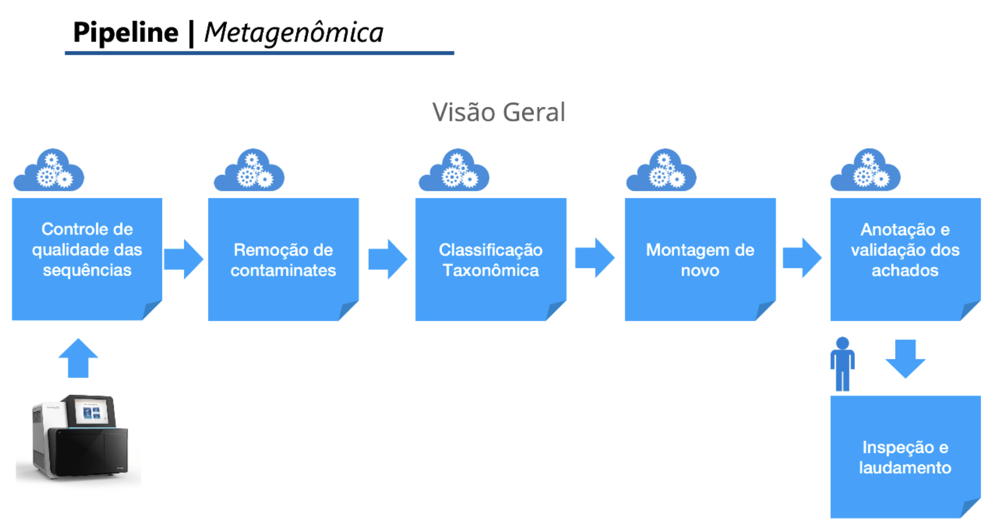

Comecemos com um banco geral de sequências referências de bactérias, alguns fungos, vírus e humanos.  

In [8]:
%%bash
# Download banco de bactérias, fungos, vírus e humano (cerca de 3 min)
wget https://genome-idx.s3.amazonaws.com/kraken/k2_pluspf_08_GB_20250714.tar.gz

--2025-11-02 19:04:52--  https://genome-idx.s3.amazonaws.com/kraken/k2_pluspf_08_GB_20250714.tar.gz
Resolving genome-idx.s3.amazonaws.com (genome-idx.s3.amazonaws.com)... 16.182.105.41, 3.5.13.29, 52.216.184.211, ...
Connecting to genome-idx.s3.amazonaws.com (genome-idx.s3.amazonaws.com)|16.182.105.41|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5940987009 (5.5G) [application/x-tar]
Saving to: ‘k2_pluspf_08_GB_20250714.tar.gz’

     0K .......... .......... .......... .......... ..........  0% 1.69M 55m50s
    50K .......... .......... .......... .......... ..........  0% 1.69M 55m55s
   100K .......... .......... .......... .......... ..........  0%  249M 37m25s
   150K .......... .......... .......... .......... ..........  0% 1.69M 41m59s
   200K .......... .......... .......... .......... ..........  0%  299M 33m39s
   250K .......... .......... .......... .......... ..........  0%  165M 28m8s
   300K .......... .......... .......... .......... ........

In [9]:
%%bash
# Extrair o banco para uma pasta (cerca de 2 min)
tar -xzvf k2_pluspf_08_GB_20250714.tar.gz -C krakenDB/
rm k2_pluspf_08_GB_20250714.tar.gz

hash.k2d
opts.k2d
taxo.k2d
seqid2taxid.map
inspect.txt
ktaxonomy.tsv
library_report.tsv
nodes.dmp
names.dmp
database50mers.kmer_distrib
database75mers.kmer_distrib
database100mers.kmer_distrib
database150mers.kmer_distrib
database200mers.kmer_distrib
database250mers.kmer_distrib
database300mers.kmer_distrib
unmapped_accessions.txt


In [10]:
%%bash
# Download do banco de definições de taxonomia do NCBI
bash /usr/local/opt/krona/updateTaxonomy.sh

Fetching taxdump.tar.gz...
   Fetching checksum...
   Checksum for taxdump.tar.gz matches server.
Extracting taxonomy...

Cleaning up...

Finished.



Estando os bancos de sequências prontos, podemos seguir para a etapa de classificação das sequências desconhecidas.

# 3. Identificação Taxonômica

In [11]:
%%bash
# Buscar cada sequência contra um banco de dados e fazer a classificação (cerca de 1 min)
kraken2 --paired cutadapt/caso1-sindrome-respiratoriav2-trimmed_R1.fastq.gz cutadapt/caso1-sindrome-respiratoriav2-trimmed_R2.fastq.gz \
-db krakenDB/ --report kraken2/caso1-sindrome-respiratoriav2-report.txt --report-minimizer --output kraken2/caso1-sindrome-respiratoriav2-output.txt

Loading database information... done.
5999993 sequences (1679.98 Mbp) processed in 179.964s (2000.4 Kseq/m, 560.11 Mbp/m).
  5310596 sequences classified (88.51%)
  689397 sequences unclassified (11.49%)


In [12]:
%%bash
# Gerar um gráfico de pizza iterativo com a classificação do kraken
ktImportTaxonomy kraken2/caso1-sindrome-respiratoriav2-output.txt \
-o krona/caso1-sindrome-respiratoriav2-kraken.html -q 2 -t 3

Loading taxonomy...
Importing kraken2/caso1-sindrome-respiratoriav2-output.txt...
Writing krona/caso1-sindrome-respiratoriav2-kraken.html...


   [ WARNING ]  Score column already in use; not reading scores.
   [ WARNING ]  The following taxonomy IDs were not found in the local
                database and were set to root (if they were recently added to
                NCBI, use updateTaxonomy.sh to update the local database):
                3366265
   [ WARNING ]  Too many query IDs to store in chart; storing supplemental
                files in
                'krona/caso1-sindrome-respiratoriav2-kraken.html.files'.


**Checkpoint 2**: Inspecione os resultados gerados, e veja se você consegue chegar a um diagnóstico plausível segundo a descrição do caso:  
Quais organismos apareceram?  
Eles são considerados patogênicos?

**Relatório de Análise Metagenômica**

*Amostra:* Swab nasofaríngeo de paciente do sexo feminino, 21 anos, síndrome respiratória aguda com febre, tosse seca e hipoxemia.

*Técnica:* Sequenciamento Metagenômico de DNA Total, shotgun.

*Arquivos analisados:* caso1-sindrome-respiratoriav2_R1.fastq.gz e caso1-sindrome-respiratoriav2_R2.fastq.gz.

*Metodologia e pipeline:* Controle de qualidade com FastQC; Classificação taxonômica com Kraken2; Visualização com Krona e Validação com BLASTn.

*Resultados Principais:* total de reads processados: em torno de 6 milhões; 88% classificados; 11% não classificados; 86% das classificadas pertencem ao reino Eukaryota, DNA humano; 7-8% de reads atribuídas a Bacteria e 0,002% atribuídas a Vírus.

*Componentes Bacterianos:* Moraxella catarrhalis (25%) é um colonizador respiratório comum; Haemophilus influenzae (11%) colonizador ou patógeno oportunista; Streptococcus oralis (12%) flora oral; Veillonella parvula (25%) comensal anaeróbio da orofaringe.
Interpretação: perfil bacteriano compatível com flora orofaríngea/colonização, nenhuma bactéria dominante isolada como agente primário.

*Componentes Virais:* Bat coronavirus BM48-31/BGR/2008
(50%); SARS coronavirus Tor2
(15%); Severe acute respiratory syndrome coronavirus 2 (SARS-CoV-2) (0,9%). Presença de leitura correspondentes a coronavírus de morcego e SARS-CoV/SARS-CoV-2. Isso indica a detecção de um coronavírus relacionado ao SARS, possivelmente um patógeno emergente com similaridade a SARS-CoV-2.

*Discussão e Conclusão:* Os achados metagenômicos são coerentes com o quadro clínico respiratório grave apresentado pela paciente (febre, tosse seca, dispneia e opacidades em vidro fosco bilaterais), indicando uma infecção de origem viral. A predominância de leituras pertencentes ao gênero Sarbecovirus, incluindo sequências com alta similaridade a SARS-CoV e SARS-CoV-2, sugere fortemente a presença de um novo coronavírus emergente geneticamente relacionado ao SARS-CoV-2. A proporção viral, embora baixa (<1%), é suficiente para sustentação diagnóstica, especialmente em amostras respiratórias com alta carga de DNA humano. A microbiota bacteriana observada (principalmente Moraxella catarrhalis, Haemophilus influenzae, Veillonella parvula e Streptococcus oralis) é compatível com flora orofaríngea ou colonização secundária, não indicando infecção bacteriana primária. Assim, o agente etiológico mais provável é um coronavírus do grupo Sarbecovirus, compatível com SARS-CoV-2, com alta confiança diagnóstica (>98% de identidade e montagem parcial consistente). Esse resultado indica a detecção de um patógeno respiratório emergente de relevância epidemiológica, justificando a realização de testes confirmatórios (RT-PCR alvo N e E), isolamento respiratório imediato dos casos suspeitos, e notificação urgente ao Ministério da Saúde e órgãos de vigilância epidemiológica, além da recomendação de sequenciamento adicional para monitoramento genômico e rastreamento de possíveis variantes.


Tendo em vista esta suspeita médica, vamos usar uma segunda abordagem de bioinformática:
- Sequências humanas não nos interessa, vamos remover
- Sequências muito curtas podem não ser boas para identificação de patógenos menos comuns, vamos fazer uma montagem delas
- Vamos incluir fungos negros conhecidos no nosso banco de dados, e realizar uma busca mais sensível com BLAST e alinhamentos

# 4. Remoção de contaminantes humanos

In [13]:
%%bash
# Indexar o genoma humano de referência para realizar o mapeamento e posterior remoção de contaminante
bwa index bwa/Chr15-reference.fasta

[bwa_index] Pack FASTA... 1.54 sec
[bwa_index] Construct BWT for the packed sequence...
[BWTIncCreate] textLength=203982378, availableWord=26352768
[BWTIncConstructFromPacked] 10 iterations done. 43469882 characters processed.
[BWTIncConstructFromPacked] 20 iterations done. 80306602 characters processed.
[BWTIncConstructFromPacked] 30 iterations done. 113043146 characters processed.
[BWTIncConstructFromPacked] 40 iterations done. 142135418 characters processed.
[BWTIncConstructFromPacked] 50 iterations done. 167988682 characters processed.
[BWTIncConstructFromPacked] 60 iterations done. 190963082 characters processed.
[bwt_gen] Finished constructing BWT in 67 iterations.
[bwa_index] 116.96 seconds elapse.
[bwa_index] Update BWT... 0.71 sec
[bwa_index] Pack forward-only FASTA... 1.10 sec
[bwa_index] Construct SA from BWT and Occ... 45.40 sec
[main] Version: 0.7.19-r1273
[main] CMD: bwa index bwa/Chr15-reference.fasta
[main] Real time: 167.857 sec; CPU: 165.702 sec


In [14]:
%%bash
THREADS=$(nproc)

bwa mem -t $THREADS bwa/Chr15-reference.fasta \
  cutadapt/caso1-sindrome-respiratoriav2-trimmed_R1.fastq.gz \
  cutadapt/caso1-sindrome-respiratoriav2-trimmed_R2.fastq.gz \
  | samtools view -b -@ $THREADS > bwa/caso1-sindrome-respiratoriav2-mapped-host.bam

[M::bwa_idx_load_from_disk] read 0 ALT contigs
[M::process] read 142832 sequences (20000105 bp)...
[M::process] read 142832 sequences (20000128 bp)...
[M::mem_pestat] # candidate unique pairs for (FF, FR, RF, RR): (0, 56548, 0, 0)
[M::mem_pestat] skip orientation FF as there are not enough pairs
[M::mem_pestat] analyzing insert size distribution for orientation FR...
[M::mem_pestat] (25, 50, 75) percentile: (319, 339, 359)
[M::mem_pestat] low and high boundaries for computing mean and std.dev: (239, 439)
[M::mem_pestat] mean and std.dev: (340.06, 28.25)
[M::mem_pestat] low and high boundaries for proper pairs: (199, 479)
[M::mem_pestat] skip orientation RF as there are not enough pairs
[M::mem_pestat] skip orientation RR as there are not enough pairs
[M::mem_process_seqs] Processed 142832 reads in 118.988 CPU sec, 71.097 real sec
[M::process] read 142836 sequences (20000262 bp)...
[M::mem_pestat] # candidate unique pairs for (FF, FR, RF, RR): (0, 56306, 0, 0)
[M::mem_pestat] skip orien

In [15]:
%%bash
# GCom a informação de mapeamento contida no BAM, vamos filtrar somente o que não mapeeou (o que não são sequências humanas)
samtools view -u -f 12 \
  -b bwa/caso1-sindrome-respiratoriav2-mapped-host.bam \
  | samtools sort -n > bwa/caso1-sindrome-respiratoriav2-unmapped-host.bam

In [16]:
%%bash
# Gerar FASTQ de reads não mapeados
samtools fastq bwa/caso1-sindrome-respiratoriav2-unmapped-host.bam \
  -1 bwa/caso1-sindrome-respiratoriav2-unmapped-host_R1.fastq \
  -2 bwa/caso1-sindrome-respiratoriav2-unmapped-host_R2.fastq

[M::bam2fq_mainloop] discarded 0 singletons
[M::bam2fq_mainloop] processed 1091652 reads


# 5. Montagem dos reads em sequências maiores

In [17]:
%%bash
# Realiza a junção das sequências menores em contigs maiores (montagem)
spades.py --meta -1 bwa/caso1-sindrome-respiratoriav2-unmapped-host_R1.fastq -2 bwa/caso1-sindrome-respiratoriav2-unmapped-host_R2.fastq -o spades/

Command line: /usr/local/bin/spades.py	--meta	-1	/content/bwa/caso1-sindrome-respiratoriav2-unmapped-host_R1.fastq	-2	/content/bwa/caso1-sindrome-respiratoriav2-unmapped-host_R2.fastq	-o	/content/spades	

System information:
  SPAdes version: 4.2.0
  Python version: 3.12.12
  OS: Linux-6.6.105+-x86_64-with-glibc2.35

Output dir: /content/spades
Mode: read error correction and assembling
Debug mode is turned OFF

Dataset parameters:
  Metagenomic mode
  Reads:
    Library number: 1, library type: paired-end
      orientation: fr
      left reads: ['/content/bwa/caso1-sindrome-respiratoriav2-unmapped-host_R1.fastq']
      right reads: ['/content/bwa/caso1-sindrome-respiratoriav2-unmapped-host_R2.fastq']
      interlaced reads: not specified
      single reads: not specified
      merged reads: not specified
Read error correction parameters:
  Iterations: 1
  PHRED offset will be auto-detected
  Corrected reads will be compressed
Assembly parameters:
  k: [21, 33, 55]
  Repeat resolution 

# 6. Nova busca

Agora, somente com as sequências não humanas e maiores (montadas), vamos realizar a nova busca com BLAST.

In [18]:
%%bash
# Configura o banco novo para buscas via BLAST
makeblastdb -in blast/Chr15-reference.fasta -dbtype nucl



Building a new DB, current time: 11/02/2025 21:35:54
New DB name:   /content/blast/Chr15-reference.fasta
New DB title:  blast/Chr15-reference.fasta
Sequence type: Nucleotide
Keep MBits: T
Maximum file size: 3000000000B
Adding sequences from FASTA; added 1 sequences in 2.09156 seconds.




In [19]:
%%bash
# Realizar nova busca, agora com BLAST
blastn -query spades/scaffolds.fasta -db blast/Chr15-reference.fasta -out blast/caso1-sindrome-respiratoriav2-blast-scaffolds.txt -outfmt 6

In [20]:
%%bash
# Gera o gráfico de pizza para visualização dos resultados
ktImportTaxonomy blast/caso1-sindrome-respiratoriav2-blast-scaffolds.txt -o krona/caso1-sindrome-respiratoriav2-blast.html

Loading taxonomy...
Importing blast/caso1-sindrome-respiratoriav2-blast-scaffolds.txt...
Writing krona/caso1-sindrome-respiratoriav2-blast.html...


**Relatório Técnico Metagenômico**

*Objetivo:* Realizar a remoção de sequências humanas da amostra respiratória (depleção do hospedeiro), seguida da montagem de novo das sequências não humanas e validação por busca de similaridade (BLASTn), com o propósito de confirmar o agente etiológico detectado nas etapas anteriores da análise metagenômica.

*Metodologia:* Remoçao de DNA humano; Validação de depleção humana; Montagem das sequências não humanas; Busca de similaridade (BLAST).

*Resultados principais: *Houve uma remoção bem sucedida das sequências humanas; Em torno de 1,09 milhão de reads não humanas obtidas; Nenhum alinhamento significativo ao genoma humano; Scaffolds microbianos longos e consistentes gerados e Alta identidade de Sarbecovirus (SARS-CoV-2 e SARS-like CoVs).

*Discussão e Conclusão:* A análise pós-remoção de DNA humano confirmou a eficácia da depleção, eliminando aproximadamente 86% das sequências do hospedeiro e preservando cerca de 1,1 milhão de reads não humanas, que após montagem e busca por similaridade apresentaram alta identidade (≥98%) com vírus do grupo Sarbecovirus, incluindo SARS-CoV-2 e coronavírus de morcego. Esses resultados confirmam, de forma independente, a presença de um coronavírus emergente compatível com SARS-CoV-2 como agente etiológico da síndrome respiratória observada. Recomenda-se confirmação por RT-PCR específica, isolamento respiratório imediato, sequenciamento genômico completo para vigilância de variantes e notificação urgente às autoridades de saúde pública.
